In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import gdown

from torchvision.models import mobilenet_v3_large
from pathlib import Path
from PIL import Image
from torchvision import transforms, utils
from torch.utils.data import DataLoader

from fairface_classification import data, utils

utils.set_random_seed(42)
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
train_label = pd.read_csv('../data/fairface_label_train.csv')
train_label

,file,age,gender,race,service_test
0,train/1.jpg,50-59,Male,East Asian,True
1,train/2.jpg,30-39,Female,Indian,False
2,train/3.jpg,3-9,Female,Black,False
3,train/4.jpg,20-29,Female,Indian,True
4,train/5.jpg,20-29,Female,Indian,True
...,...,...,...,...,...
86739,train/86740.jpg,20-29,Male,Indian,True
86740,train/86741.jpg,10-19,Male,Indian,True
86741,train/86742.jpg,more than 70,Female,Indian,True
86742,train/86743.jpg,10-19,Female,Black,True


In [3]:
mobilenet = mobilenet_v3_large(weights='IMAGENET1K_V1')
print(mobilenet)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

### Conduct basic EDA on how images look like

0 data/train/36578.jpg
1 data/train/3429.jpg
2 data/train/48684.jpg
3 data/train/23269.jpg


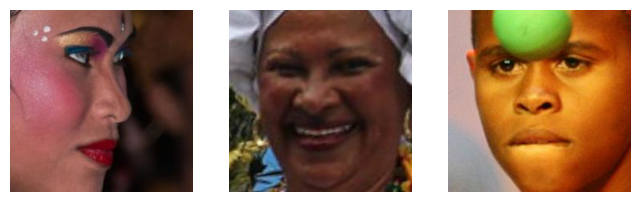

4 data/train/42306.jpg
5 data/train/45452.jpg
6 data/train/70833.jpg


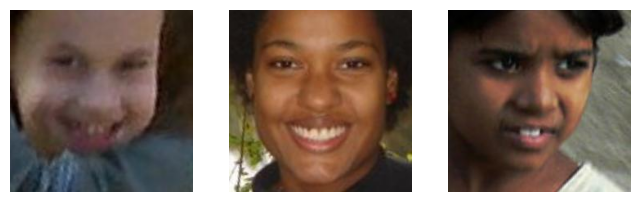

7 data/train/53880.jpg
8 data/train/8120.jpg
9 data/train/73480.jpg


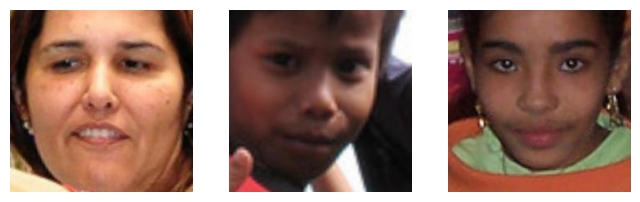

10 data/train/56667.jpg
11 data/train/2179.jpg
12 data/train/1151.jpg


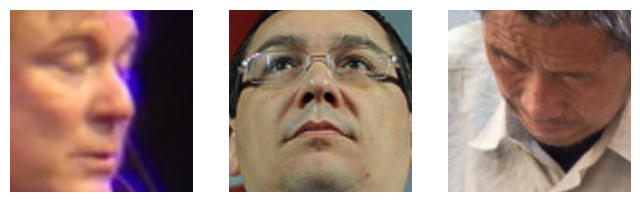

13 data/train/69744.jpg
14 data/train/68353.jpg
15 data/train/31877.jpg


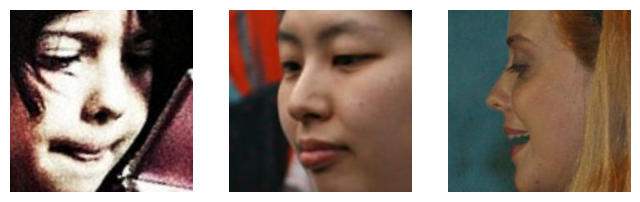

16 data/train/48044.jpg
17 data/train/29969.jpg
18 data/train/756.jpg


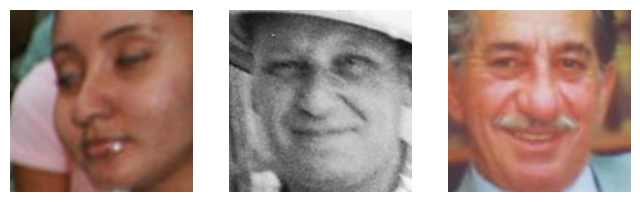

19 data/train/7709.jpg
20 data/train/21817.jpg
21 data/train/84.jpg


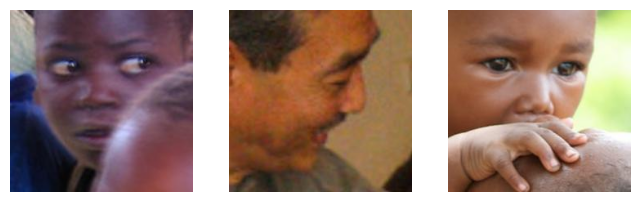

22 data/train/30633.jpg
23 data/train/77512.jpg
24 data/train/58209.jpg


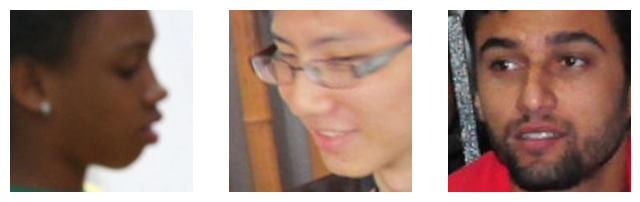

25 data/train/35070.jpg
26 data/train/67121.jpg
27 data/train/2706.jpg


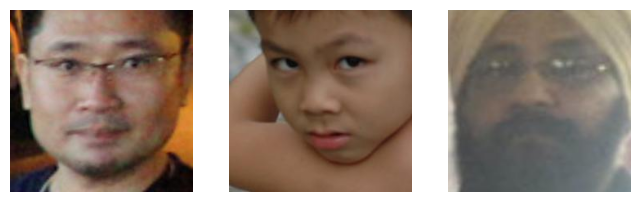

28 data/train/60140.jpg
29 data/train/57562.jpg
30 data/train/67176.jpg


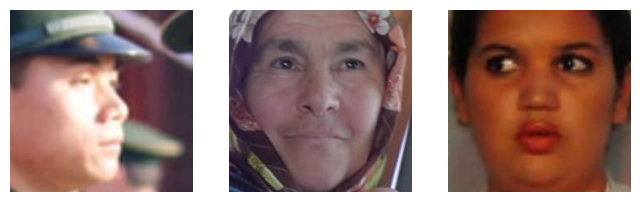

31 data/train/70023.jpg
32 data/train/50126.jpg
33 data/train/40069.jpg


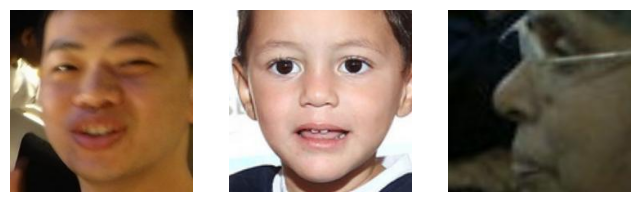

34 data/train/28709.jpg
35 data/train/61012.jpg
36 data/train/63212.jpg


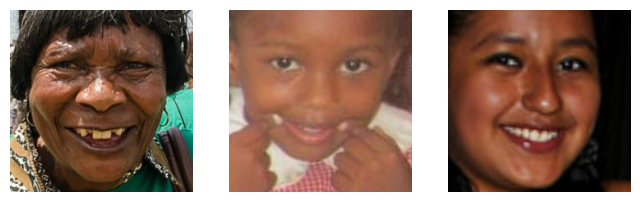

37 data/train/3000.jpg
38 data/train/11277.jpg
39 data/train/75958.jpg


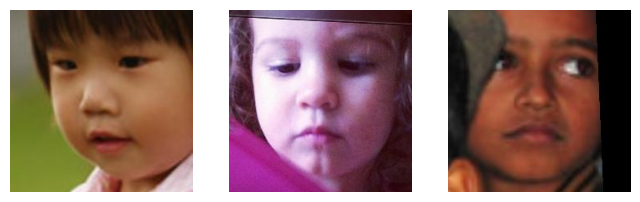

40 data/train/67229.jpg
41 data/train/16673.jpg
42 data/train/16688.jpg


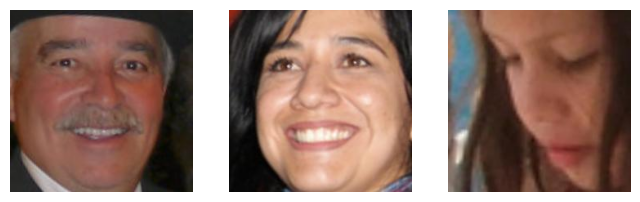

43 data/train/39887.jpg
44 data/train/11661.jpg
45 data/train/36487.jpg


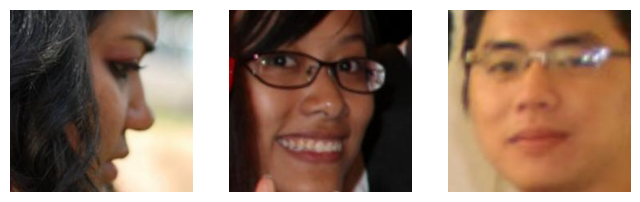

46 data/train/36453.jpg
47 data/train/54192.jpg
48 data/train/39397.jpg


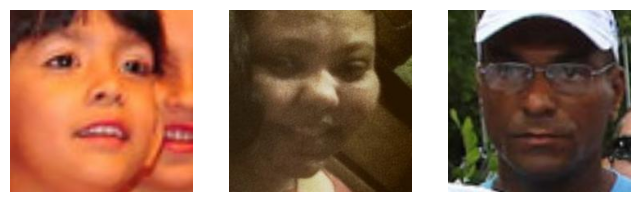

49 data/train/48911.jpg
50 data/train/32293.jpg
51 data/train/46196.jpg


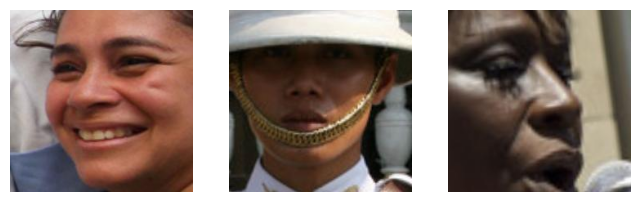

52 data/train/47468.jpg
53 data/train/66510.jpg
54 data/train/14241.jpg


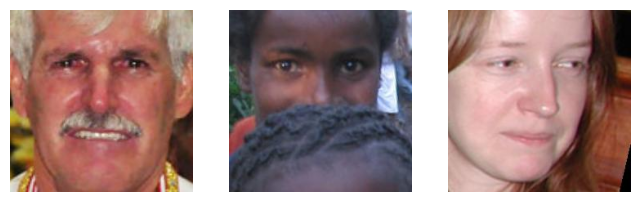

55 data/train/49461.jpg
56 data/train/71817.jpg
57 data/train/5064.jpg


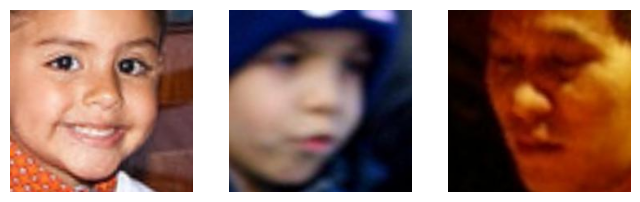

58 data/train/69857.jpg
59 data/train/723.jpg
60 data/train/52581.jpg


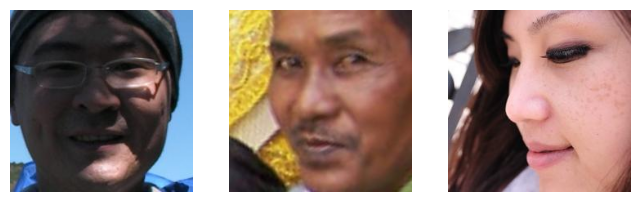

61 data/train/9977.jpg
62 data/train/55899.jpg
63 data/train/54943.jpg


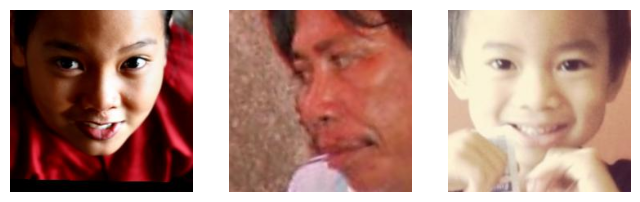

64 data/train/8526.jpg
65 data/train/24009.jpg
66 data/train/35184.jpg


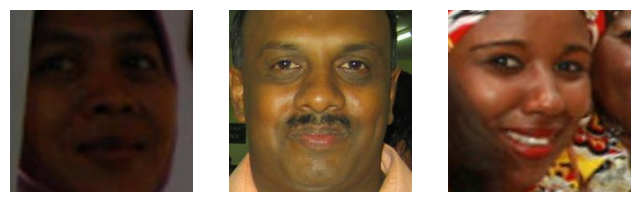

67 data/train/33279.jpg
68 data/train/24387.jpg
69 data/train/31023.jpg


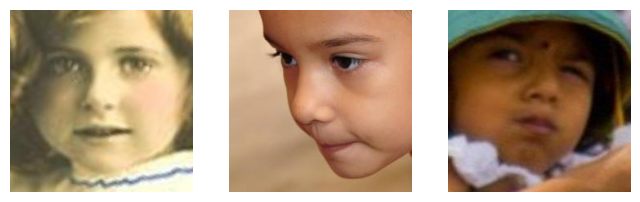

70 data/train/28439.jpg
71 data/train/25856.jpg
72 data/train/12443.jpg


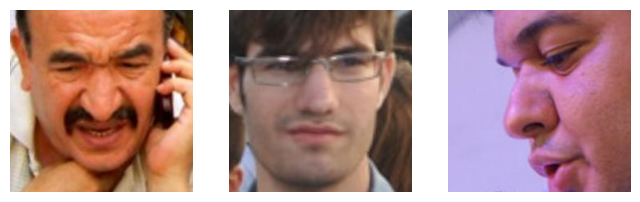

73 data/train/73982.jpg
74 data/train/76861.jpg
75 data/train/58417.jpg


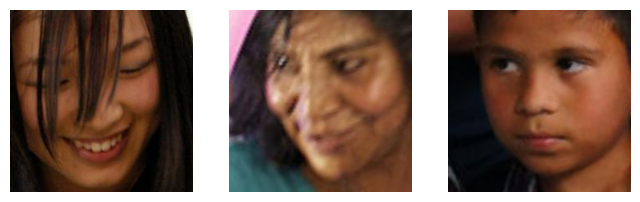

76 data/train/79838.jpg
77 data/train/14634.jpg
78 data/train/29629.jpg


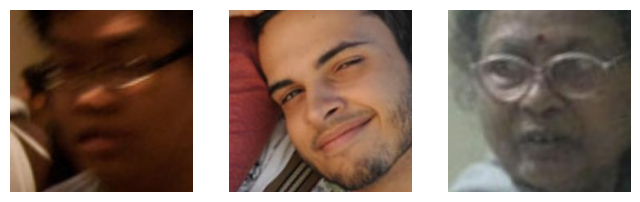

79 data/train/24172.jpg
80 data/train/67507.jpg
81 data/train/34413.jpg


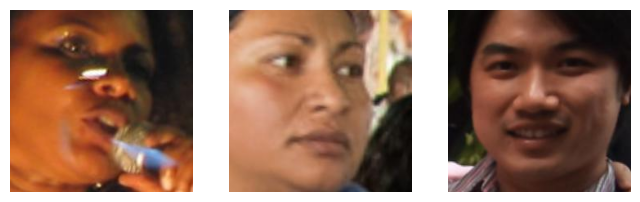

82 data/train/75295.jpg
83 data/train/86262.jpg
84 data/train/67501.jpg


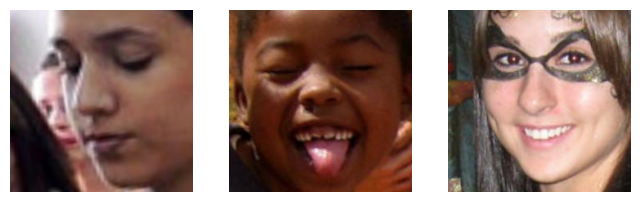

85 data/train/45046.jpg
86 data/train/68698.jpg
87 data/train/22304.jpg


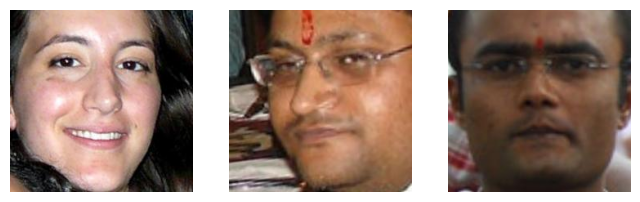

88 data/train/69972.jpg
89 data/train/33977.jpg
90 data/train/57454.jpg


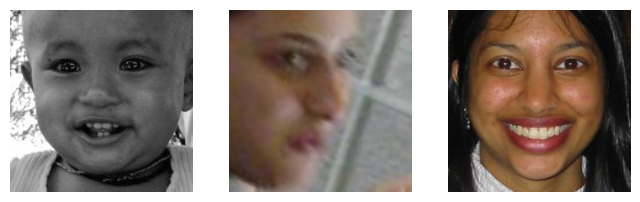

91 data/train/53279.jpg
92 data/train/29787.jpg
93 data/train/74509.jpg


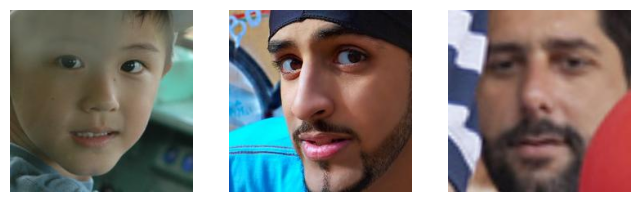

94 data/train/55269.jpg
95 data/train/75247.jpg
96 data/train/64042.jpg


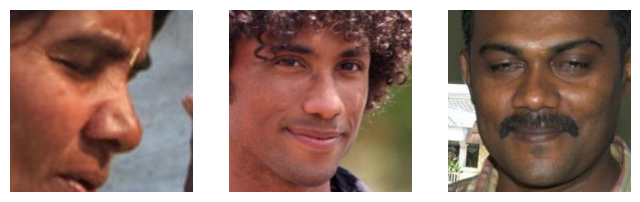

97 data/train/73650.jpg
98 data/train/17726.jpg
99 data/train/15471.jpg


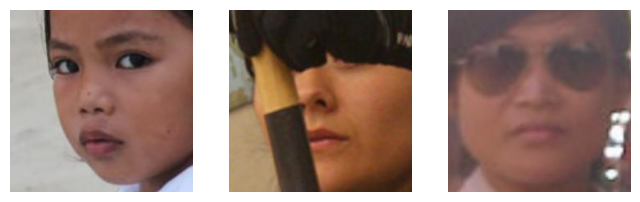

100 data/train/3784.jpg
101 data/train/44668.jpg
102 data/train/44821.jpg


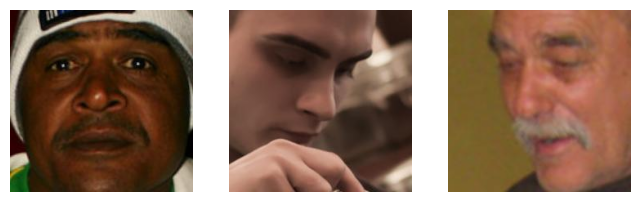

103 data/train/67721.jpg
104 data/train/51210.jpg
105 data/train/4929.jpg


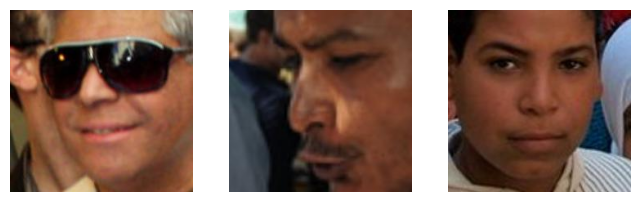

106 data/train/41704.jpg
107 data/train/35758.jpg
108 data/train/66307.jpg


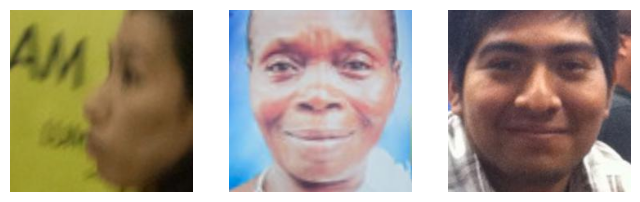

109 data/train/9760.jpg
110 data/train/45698.jpg
111 data/train/4977.jpg


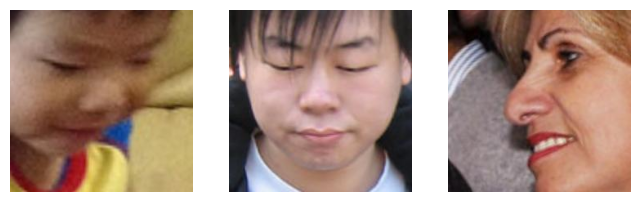

112 data/train/7199.jpg
113 data/train/54938.jpg
114 data/train/18982.jpg


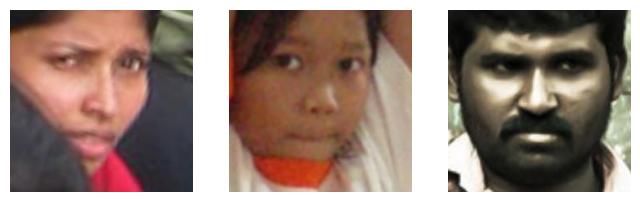

115 data/train/53123.jpg
116 data/train/28310.jpg
117 data/train/51489.jpg


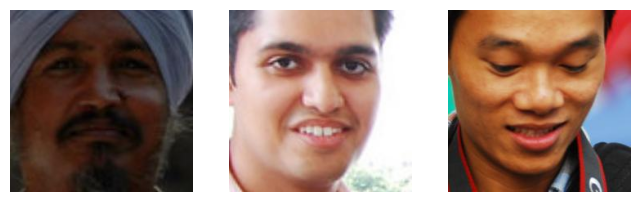

118 data/train/39478.jpg
119 data/train/23411.jpg
120 data/train/44721.jpg


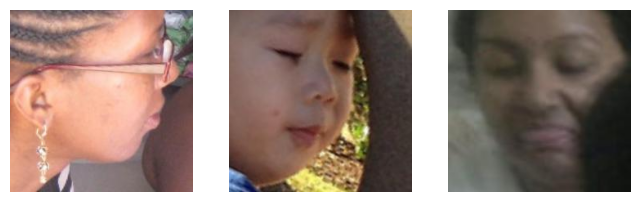

121 data/train/20367.jpg
122 data/train/68335.jpg
123 data/train/68332.jpg


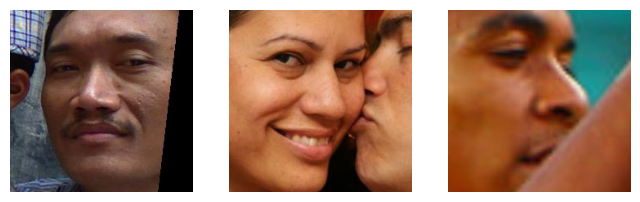

124 data/train/54962.jpg
125 data/train/74860.jpg
126 data/train/37950.jpg


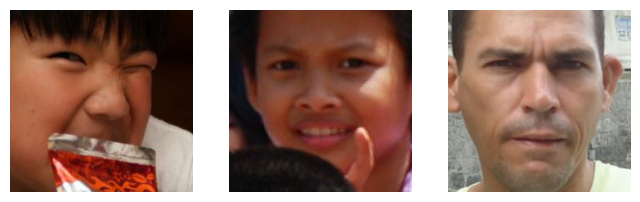

127 data/train/35851.jpg
128 data/train/41586.jpg
129 data/train/34441.jpg


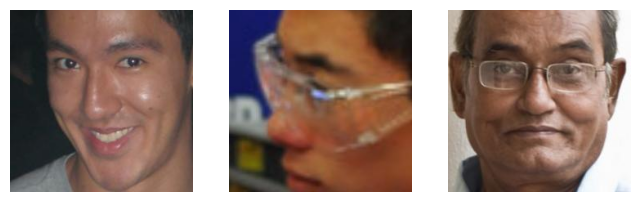

130 data/train/57746.jpg
131 data/train/10995.jpg
132 data/train/77287.jpg


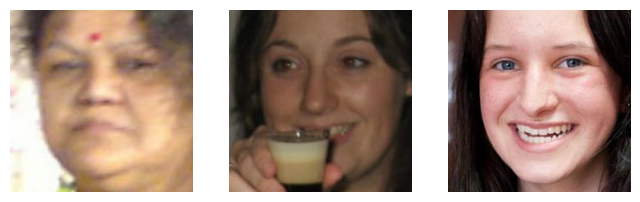

133 data/train/35100.jpg
134 data/train/26368.jpg
135 data/train/28483.jpg


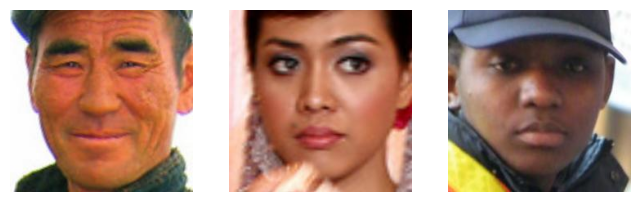

136 data/train/50876.jpg
137 data/train/32595.jpg
138 data/train/28693.jpg


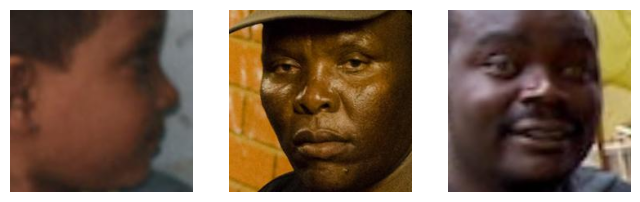

139 data/train/22897.jpg
140 data/train/26725.jpg
141 data/train/50941.jpg


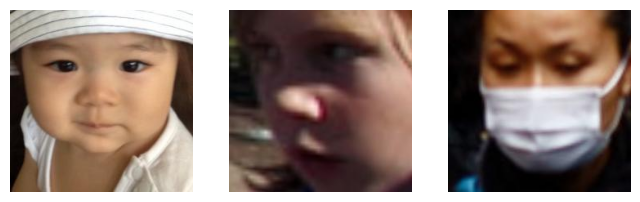

142 data/train/17854.jpg
143 data/train/13571.jpg
144 data/train/33769.jpg


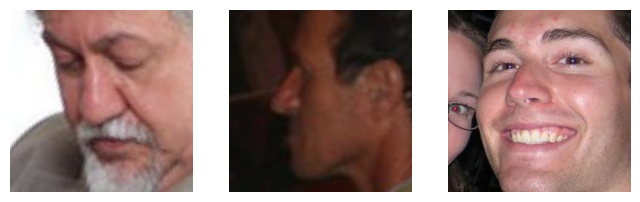

145 data/train/18563.jpg
146 data/train/13585.jpg
147 data/train/24717.jpg


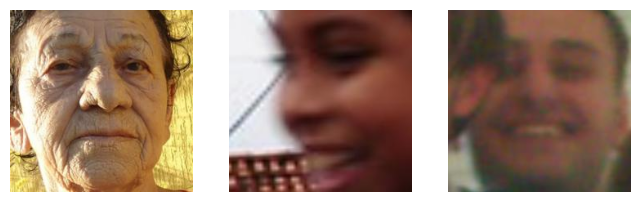

148 data/train/31346.jpg
149 data/train/61886.jpg
150 data/train/77699.jpg


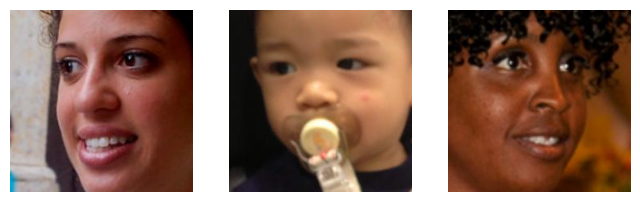

151 data/train/16567.jpg
152 data/train/77323.jpg
153 data/train/61467.jpg


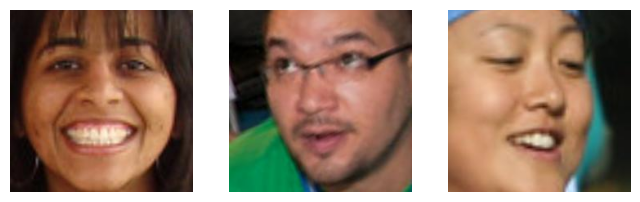

154 data/train/15922.jpg
155 data/train/78373.jpg
156 data/train/4758.jpg


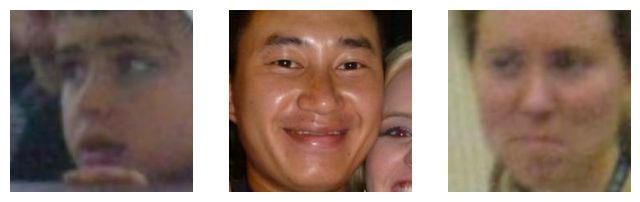

157 data/train/1844.jpg
158 data/train/8026.jpg
159 data/train/1495.jpg


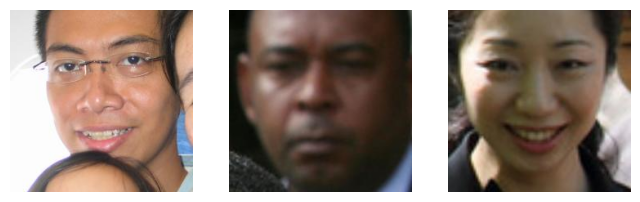

160 data/train/663.jpg
161 data/train/69473.jpg
162 data/train/54811.jpg


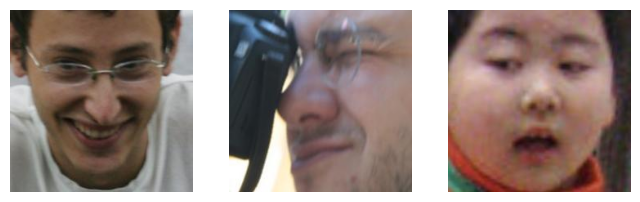

163 data/train/56125.jpg
164 data/train/65801.jpg
165 data/train/47512.jpg


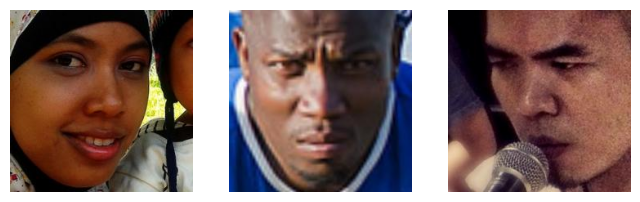

166 data/train/41937.jpg
167 data/train/13228.jpg
168 data/train/15813.jpg


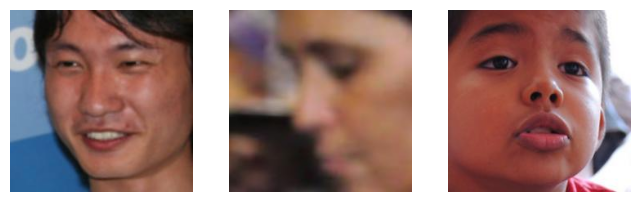

169 data/train/18841.jpg
170 data/train/17094.jpg
171 data/train/81118.jpg


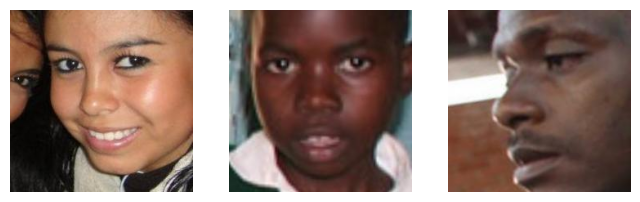

172 data/train/19405.jpg
173 data/train/64378.jpg
174 data/train/54944.jpg


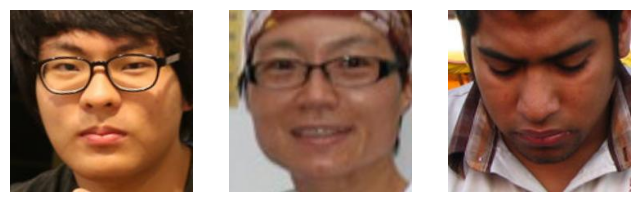

175 data/train/56311.jpg
176 data/train/67081.jpg
177 data/train/21667.jpg


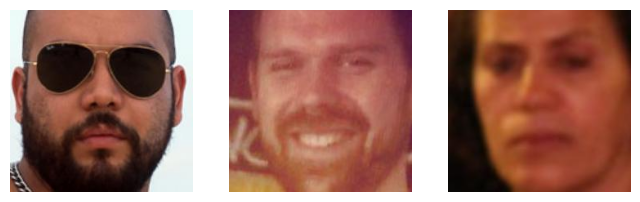

178 data/train/37751.jpg
179 data/train/39259.jpg
180 data/train/61996.jpg


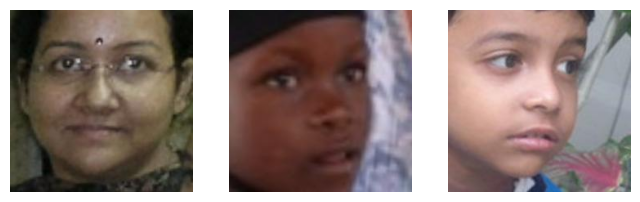

181 data/train/11784.jpg
182 data/train/65957.jpg
183 data/train/68561.jpg


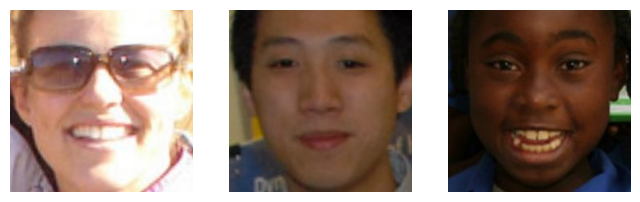

184 data/train/83046.jpg
185 data/train/43632.jpg
186 data/train/20671.jpg


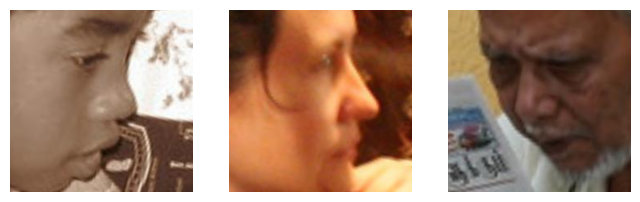

187 data/train/36296.jpg
188 data/train/37079.jpg
189 data/train/82496.jpg


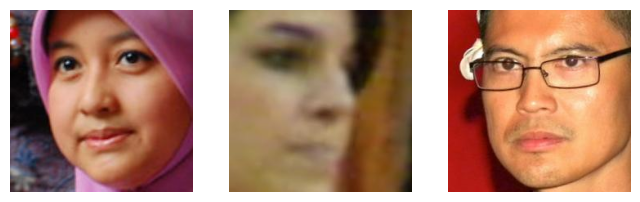

190 data/train/43318.jpg
191 data/train/11106.jpg
192 data/train/42825.jpg


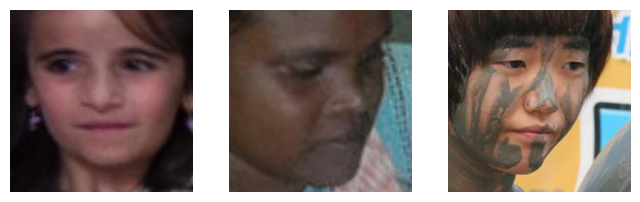

193 data/train/58795.jpg
194 data/train/86566.jpg
195 data/train/664.jpg


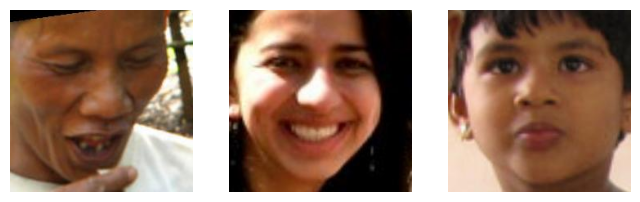

196 data/train/62907.jpg
197 data/train/39724.jpg
198 data/train/27199.jpg


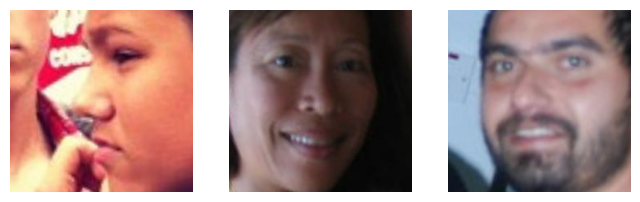

199 data/train/52719.jpg
200 data/train/36429.jpg
201 data/train/40473.jpg


In [77]:
data_path = Path('data')
plot_imgs = []

for i, file in enumerate((data_path / 'train').glob('*')):
    print(i, file)
    if i > 200:
        break
    if i % 3 == 0 and i != 0:
        fig, axs = plt.subplots(1, 3, figsize=(8, 4))
        image1 = Image.open(plot_imgs[0]).convert('RGB')
        image2 = Image.open(plot_imgs[1]).convert('RGB')
        image3 = Image.open(plot_imgs[2]).convert('RGB')
        axs[0].imshow(np.array(image1))
        axs[1].imshow(np.array(image2))
        axs[2].imshow(np.array(image3))
        axs[0].axis('off')
        axs[1].axis('off')
        axs[2].axis('off')
        plt.show()
        fig.savefig(data_path / 'EDA_images' / f'{file.stem}.png');
        plot_imgs = []
    plot_imgs.append(file)

### Check labels of the train dataset

In [4]:
train_label['age'].value_counts(normalize=True) * 100

age
20-29           29.509822
30-39           22.191737
40-49           12.385871
3-9             11.998524
10-19           10.494098
50-59            7.179747
60-69            3.203680
0-2              2.065849
more than 70     0.970672
Name: proportion, dtype: float64

In [5]:
train_label['race'].value_counts(normalize=True) * 100

race
White              19.052615
Latino_Hispanic    15.409711
Indian             14.201559
East Asian         14.164668
Black              14.102416
Southeast Asian    12.444665
Middle Eastern     10.624366
Name: proportion, dtype: float64

In [6]:
train_label['gender'].value_counts(normalize=True) * 100

gender
Male      53.013465
Female    46.986535
Name: proportion, dtype: float64

### Check which combination is the most popular

the most popular human are white 20-29 y.o. female/male and east asian female with the same age group 

In [7]:
train_label.groupby(['age', 'race', 'gender']).agg({'age' : 'count'}).rename({'age' : 'age_col'}, axis=1).sort_values('age_col', ascending=False).head(50)

age_col
age   race            gender         
20-29 White           Female     2972
      East Asian      Female     2902
      White           Male       2249
30-39 White           Male       2228
20-29 Latino_Hispanic Female     2004
30-39 White           Female     1911
20-29 Southeast Asian Female     1871
      East Asian      Male       1863
30-39 Middle Eastern  Male       1782
20-29 Black           Female     1769
      Indian          Female     1704
      Southeast Asian Male       1639
30-39 Indian          Male       1607
      Latino_Hispanic Male       1557
20-29 Latino_Hispanic Male       1527
      Black           Male       1402
30-39 Latino_Hispanic Female     1375
20-29 Indian          Male       1373
40-49 White           Male       1365
30-39 Black           Female     1323
                      Male       1296
20-29 Middle Eastern  Male       1282
30-39 East Asian      Male       1267
3-9   Black           Male       1230
40-49 Middle Eastern  Male       1190
30-39 Indian          Female     1164
40-49 Latino_Hispanic Male       1125
30-39 East Asian      Female     1115
      Southeast Asian Male       1093
3-9   East Asian      Male       1061
20-29 Middle Eastern  Female     1041
40-49 Indian          Male        976
50-59 White           Male        969
10-19 Latino_Hispanic Female      918
30-39 Southeast Asian Female      916
10-19 Indian          Female      890
      Black           Female      850
3-9   Black           Female      842
      Latino_Hispanic Female      837
      Indian          Male        835
40-49 Latino_Hispanic Female      832
3-9   Southeast Asian Male        821
40-49 White           Female      814
      Black           Male        777
3-9   Latino_Hispanic Male        752
10-19 Southeast Asian Female      718
3-9   Southeast Asian Female      702
50-59 Latino_Hispanic Male        698
3-9   Indian          Female      695
10-19 Latino_Hispanic Male        691

In [21]:
dataset = data.FairFaceDataset('fairface_label_train.csv', 
                               '/home/FairFace_Modeling/',
                               'data', mode='train')

TypeError: string indices must be integers

0 (224, 224, 3) 50-59 Male East Asian
1 (224, 224, 3) 30-39 Female Indian
2 (224, 224, 3) 3-9 Female Black
3 (224, 224, 3) 20-29 Female Indian


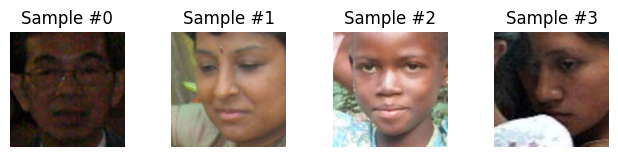

In [5]:
for i, sample in enumerate(dataset):
    print(i, sample['image'].shape, sample['age'], sample['gender'], sample['race'])

    ax = plt.subplot(1, 4, i + 1)
    plt.tight_layout()
    ax.set_title(f'Sample #{i}')
    ax.axis('off')
    plt.imshow(sample['image'])
    if i == 3:
        plt.show()
        break

In [6]:
del dataset

### All images are (224, 224) resolution so there is no need to make rescaling before MobileNetV3 large model input

In [8]:
race_dict = data.read_json('../data/encodings/race_encoding.json')
gender_dict = data.read_json('../data/encodings/gender_encoding.json')
age_dict = data.read_json('../data/encodings/age_encoding.json')

encoders = {'race' : race_dict, 'age' : age_dict, 'gender' : gender_dict}

In [9]:
fairface_dataset = data.FairFaceDataset('fairface_label_train.csv',
                               root_dir='/home/FairFace_Modeling/',
                               mode='train', encoders=encoders, transform=transforms.Compose([transforms.ToTensor(),
                                                                                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                                                                                                           std=[0.229, 0.224, 0.225])]))


### Explore how images look like after normalization

In [16]:
# Check how tranformings were applied to the fairface dataset
for i, sample in enumerate(fairface_dataset):
    print(i ,sample['image'].size(), sample['race'], sample['gender'], sample['age'])

    if i == 3:
        break

0 torch.Size([3, 224, 224]) 3 0 6
1 torch.Size([3, 224, 224]) 2 1 4
2 torch.Size([3, 224, 224]) 2 1 3
3 torch.Size([3, 224, 224]) 2 1 3


### Start using Dataloader

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 torch.Size([4, 3, 224, 224]) tensor([0, 1, 1, 6]) tensor([0, 1, 0, 0]) tensor([4, 4, 5, 3])
1 torch.Size([4, 3, 224, 224]) tensor([3, 2, 3, 1]) tensor([1, 1, 1, 0]) tensor([3, 3, 4, 6])
2 torch.Size([4, 3, 224, 224]) tensor([3, 4, 0, 6]) tensor([0, 0, 1, 0]) tensor([2, 4, 3, 4])
3 torch.Size([4, 3, 224, 224]) tensor([4, 1, 3, 2]) tensor([0, 0, 1, 0]) tensor([3, 3, 2, 3])


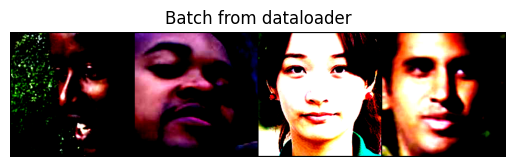

In [17]:
dataloader = DataLoader(fairface_dataset, batch_size=4, shuffle=True, num_workers=5)

def show_images_batch(sample_batched):
    images_batch = sample_batched['image']

    grid = utils.make_grid(images_batch)
    plt.imshow(grid.numpy().transpose((1, 2, 0)))

    plt.title('Batch from dataloader')

for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['image'].size(), sample_batched['race'], sample_batched['gender'], sample_batched['age'])

    if i_batch == 3:
        plt.figure()
        show_images_batch(sample_batched)
        plt.axis('off')
        plt.ioff()
        plt.show()
        break


### Create train-test split

In [10]:
train_label = pd.read_csv('../data/fairface_label_train.csv')
val_label = pd.read_csv('../data/fairface_label_val.csv')
train_data, test_data = data.train_test_split(train_label)

train_data.head()

,file,age,gender,race,service_test
0,train/47414.jpg,20-29,Male,Middle Eastern,True
1,train/52264.jpg,30-39,Male,Middle Eastern,False
2,train/21584.jpg,10-19,Female,Indian,False
3,train/32130.jpg,30-39,Male,Black,False
4,train/63301.jpg,10-19,Male,Indian,True


In [11]:
train_label = pd.read_csv('../data/fairface_label_train.csv')
train_data, test_data = data.train_test_split(train_label)

In [12]:
# write to the root dir of the project
with open('../train_test_val.json', 'w') as outfile:
    json.dump({'train' : train_data['file'].tolist(), 
               'test' : test_data['file'].tolist(), 
               'val' : val_label['file'].tolist()}, 
               outfile)

### Create encodings for labels

In [13]:
race_dict = dict(enumerate(['White', 'Latino_Hispanic', 'Indian', 'East Asian', 'Black', 'Southeast Asian', 'Middle Eastern']))
gender_dict = dict(enumerate(['Male', 'Female']))
age_dict = dict(enumerate(['0-2', '3-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', 'more than 70']))

race_dict = {v : k for (k, v) in race_dict.items()}
gender_dict = {v : k for (k, v) in gender_dict.items()}
age_dict = {v : k for (k, v) in age_dict.items()}

save_folder = '../data/encodings/'
encod_dicts = [race_dict, gender_dict, age_dict]
name_encod = ['race_encoding.json', 'gender_encoding.json', 'age_encoding.json']
name_encod = [save_folder + file for file in name_encod]

if 'encodings' not in os.listdir('../data/'):
    os.mkdir(save_folder)

for i in range(len(encod_dicts)):
    data.write_json(encod_dicts[i], name_encod[i])

### Unzip files

In [16]:
path = Path('../data/')

url = 'https://drive.google.com/uc?id=1n1wjPXLRlMrJjFdX1SxoiaO1JgwbQuFV'
output = path / 'fairface_dataset.zip'
gdown.download(url, str(output), quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1n1wjPXLRlMrJjFdX1SxoiaO1JgwbQuFV
To: /home/FairFace_Modeling/data/fairface_dataset.zip
100%|██████████| 578M/578M [00:20<00:00, 28.2MB/s] 


'../data/fairface_dataset.zip'

In [15]:
import zipfile

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(path)